In [ ]:
!nvidia-smi

Fri Jan 26 10:30:20 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   55C    P8              11W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

# Исследование влияния числа эпох обучения
Измените число эпох обучения в лабораторной работе и оцените, как это
влияет на представления узлов и Node Similarity. Добавьте график,
отображающий изменение метрики Node Similarity в зависимости от числа
эпох.
# Сравнение различных моделей
Попробуйте другие модели графовых вложений, такие как HolE или DistMult, и
сравните их эффективность в предсказании отношений и измерении Node
Similarity.
# Анализ случайных узлов
Выберите несколько случайных узлов и проанализируйте их сходство с другими
узлами. Обратите внимание на изменения при изменении числа эпох обучения
или использовании различных моделей

In [ ]:
!pip install pykeen networkx matplotlib -q

In [ ]:
import torch
import pykeen
import numpy as np
import matplotlib.pyplot as plt
from pykeen.pipeline import pipeline
from pykeen.evaluation import RankBasedEvaluator
from sklearn.metrics.pairwise import cosine_similarity, euclidean_distances, manhattan_distances
from pykeen.datasets import DBpedia50
from sklearn.neighbors import NearestNeighbors

INFO:pykeen.utils:Using opt_einsum


In [ ]:
# Function for visualizing node embeddings
def visualize_embeddings(embeddings, labels):
    plt.figure(figsize=(10, 8))
    plt.scatter(embeddings[:, 0], embeddings[:, 1], c=np.arange(len(labels)), cmap='viridis', s=25)
    for i, label in enumerate(labels):
        plt.annotate(label, (embeddings[i, 0], embeddings[i, 1]), alpha=1)
    plt.title('Scatter Plot of Embeddings')
    plt.show()


# Function for visualizing the similarity matrix
def display_matrix(similarity_matrix, title='Node Similarity Matrix'):
    plt.figure(figsize=(8, 8))
    plt.imshow(similarity_matrix, cmap='viridis', interpolation='nearest')
    plt.colorbar()
    plt.title(title)
    plt.show()

In [ ]:
evaluated_models = {}

In [ ]:
# Loading the graph dataset DBpedia50
dbpedia_dataset = DBpedia50()
entity_labels = list(dbpedia_dataset.testing.entity_id_to_label.values())

# Parameters for research
num_epochs_list = [10, 25, 50, 100, 150]
models = ["HolE", "DistMult"]
node_indices = [1324, 12240, 15386, 17242]  # Example node indices for analysis

for model_name in models:
    for num_epochs in num_epochs_list:
        # Model training
        pipeline_results = pipeline(
            model=model_name,
            dataset=dbpedia_dataset,
            training_kwargs=dict(num_epochs=num_epochs, batch_size=128),
            evaluation_kwargs=dict(batch_size=64),
            device=torch.device("cuda" if torch.cuda.is_available() else "cpu"),

        )
        evaluated_models[(model_name, num_epochs)] = pipeline_results

        # Obtaining node embeddings
        # node_embeddings = pipeline_results.model.entity_representations[0]._embeddings.weight.data.cpu().numpy()

        # Visualizing nodes
        # visualize_embeddings(node_embeddings[:25], entity_labels[:25])

        # Measuring Node Similarity for selected nodes
        # nodes = node_embeddings[node_indices]
        # for method in [euclidean_distances, cosine_similarity, manhattan_distances]:
            # similarity_matrix = method(nodes)
            # display_matrix(similarity_matrix, title=f'{model_name} - {num_epochs} epochs')

        # Searching for neighbors for random nodes
        # nn_model = NearestNeighbors(n_neighbors=5, metric='euclidean')
        # nn_model.fit(node_embeddings)
        # for node_index in node_indices:
            # distances, indices = nn_model.kneighbors([node_embeddings[node_index]])
            # neighbor_labels = [entity_labels[i] for i in indices.flatten()]
            # print(f"Closest neighbors of node {entity_labels[node_index]}: {neighbor_labels}")

INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/10 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.51s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/25 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.75s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.57s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.58s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/150 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 4.66s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/10 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.81s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/25 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.82s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/50 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.82s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/100 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 1.02s seconds
INFO:pykeen.pipeline.api:Using device: cuda


Training epochs on cuda:0:   0%|          | 0/150 [00:00<?, ?epoch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Training batches on cuda:0:   0%|          | 0/252 [00:00<?, ?batch/s]

Evaluating on cuda:0:   0%|          | 0.00/2.10k [00:00<?, ?triple/s]

INFO:pykeen.evaluation.evaluator:Evaluation took 0.99s seconds


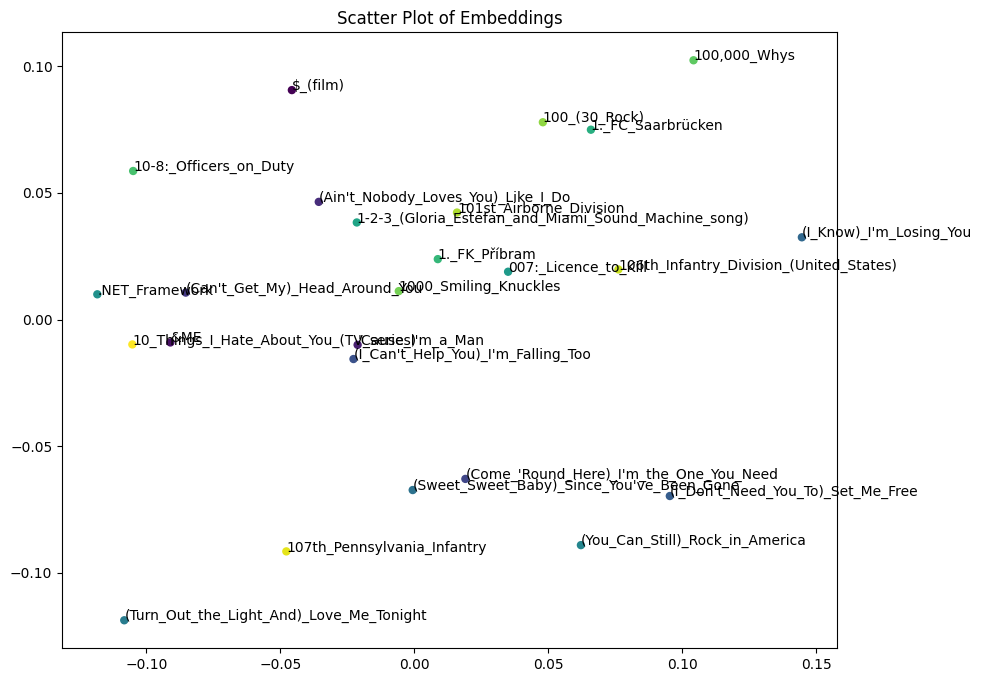

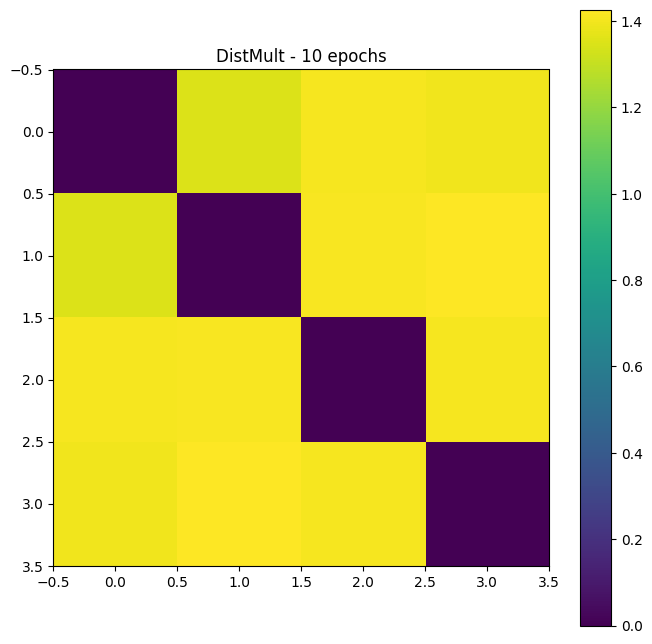

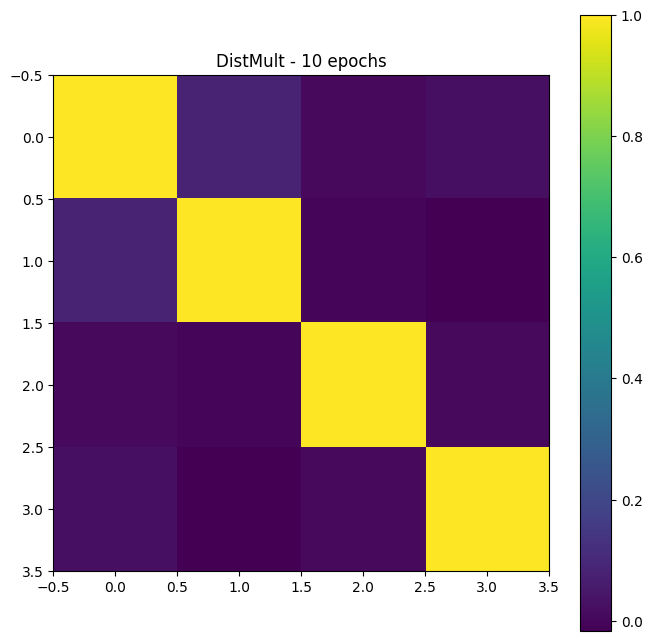

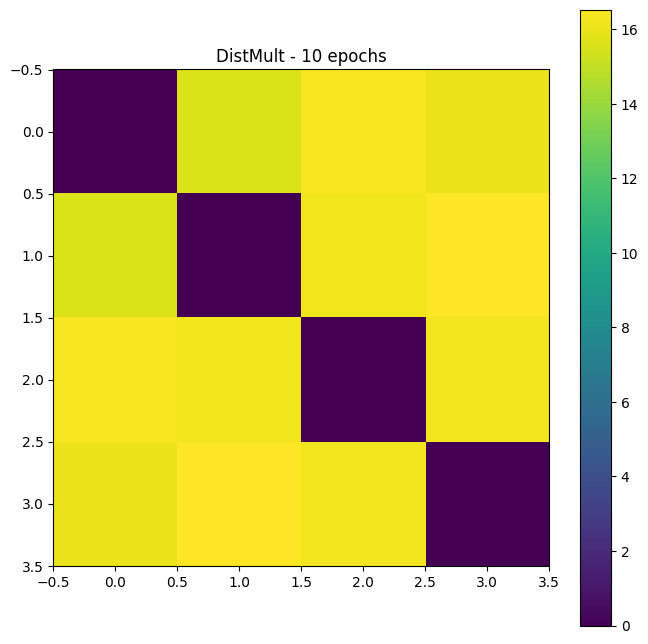

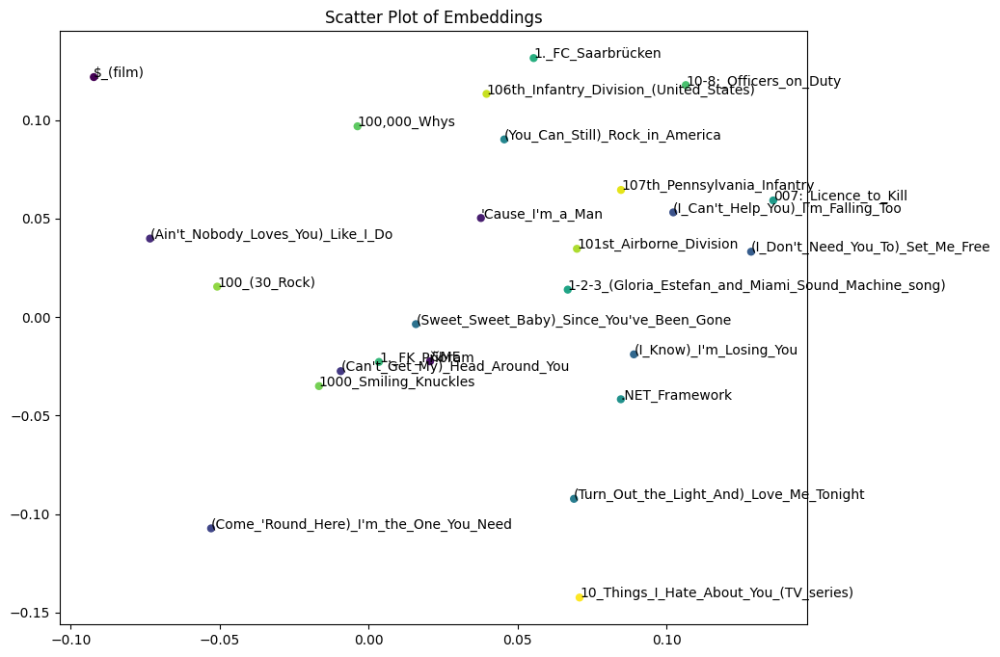

...

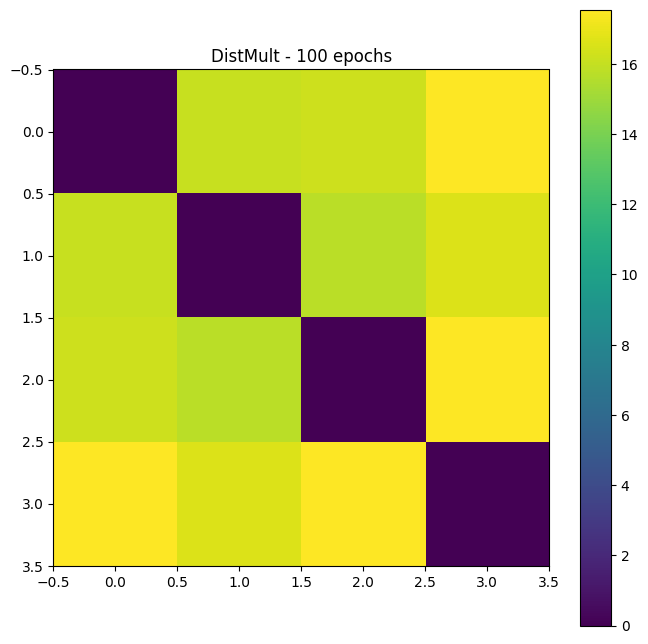

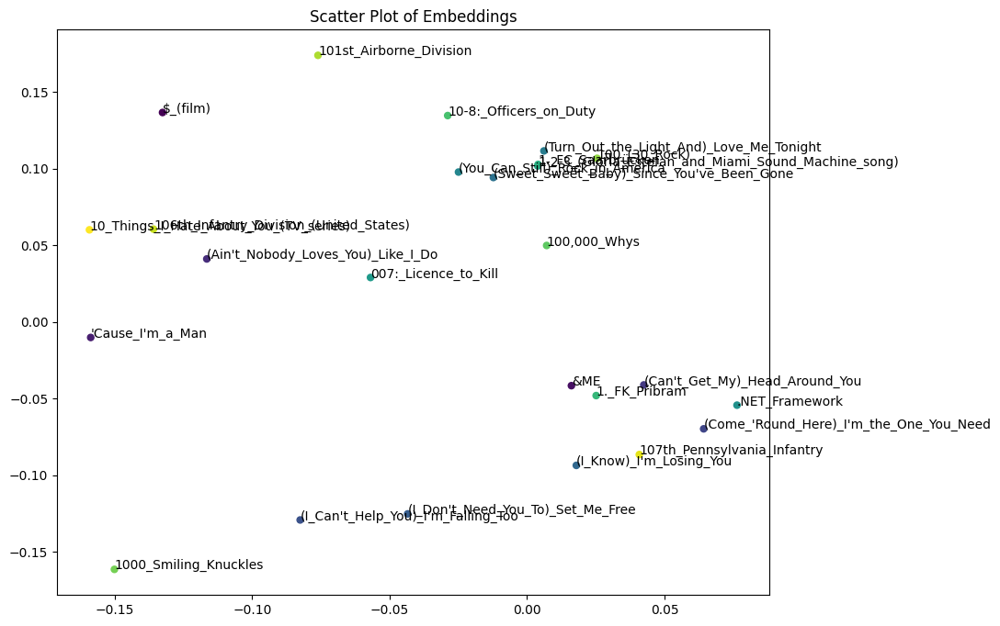

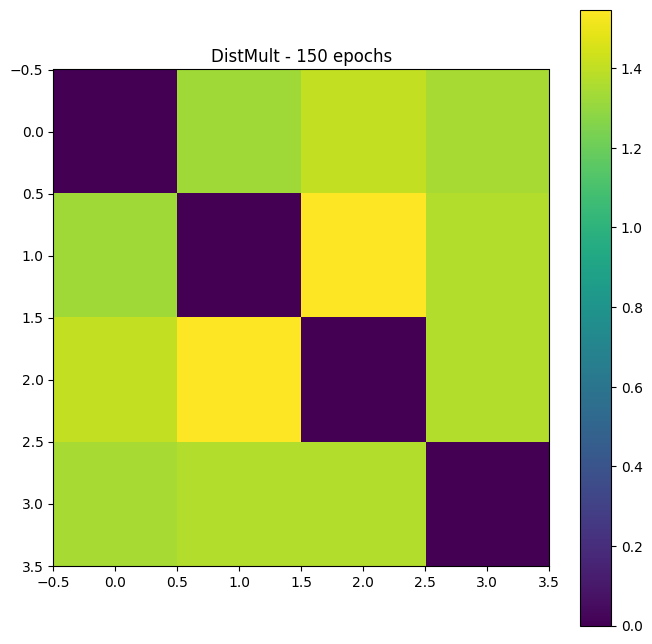

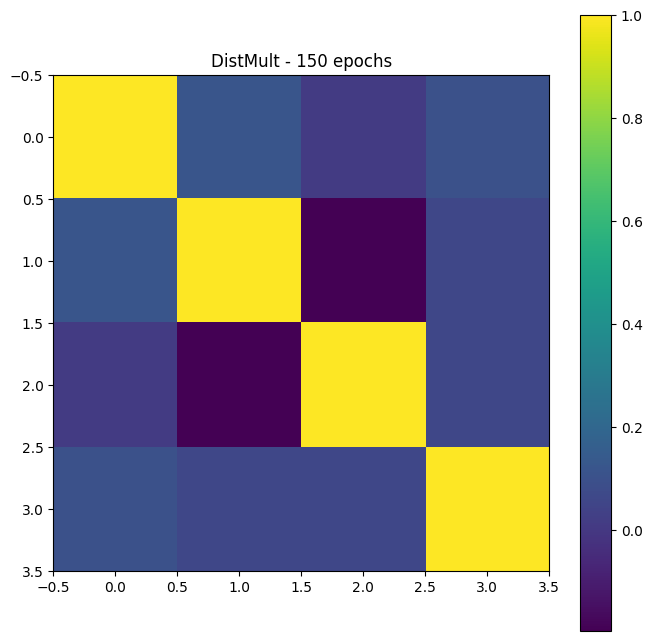

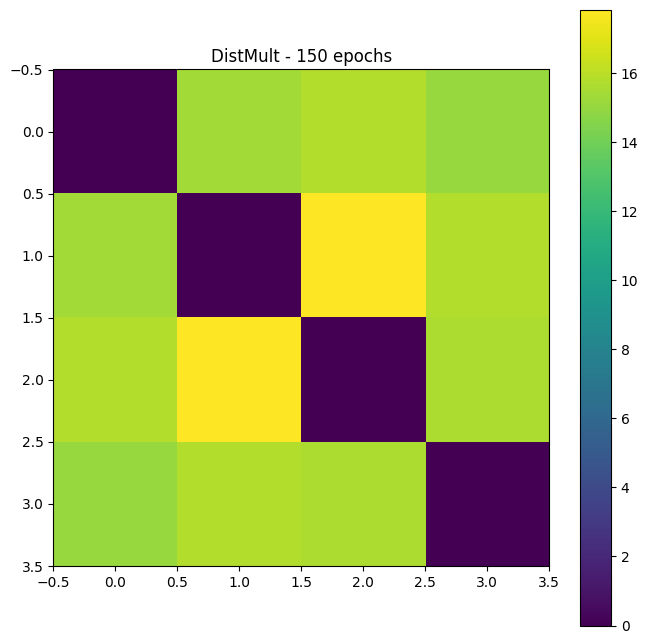

In [ ]:
avg_similarities = {}
for model in evaluated_models:
  if model[0] == 'HolE':
    pipeline_results = evaluated_models[model]
    node_embeddings = pipeline_results.model.entity_representations[0]._embeddings.weight.data.cpu().numpy()

    visualize_embeddings(node_embeddings[:25], entity_labels[:25])

    nodes = node_embeddings[node_indices]
    for method in [euclidean_distances, cosine_similarity, manhattan_distances]:
        similarity_matrix = method(nodes)
        avg_similarities[(method, model[1])] = np.expand_dims(similarity_matrix, axis=1).mean()
        display_matrix(similarity_matrix, title=f'{model_name} - {model[1]} epochs')

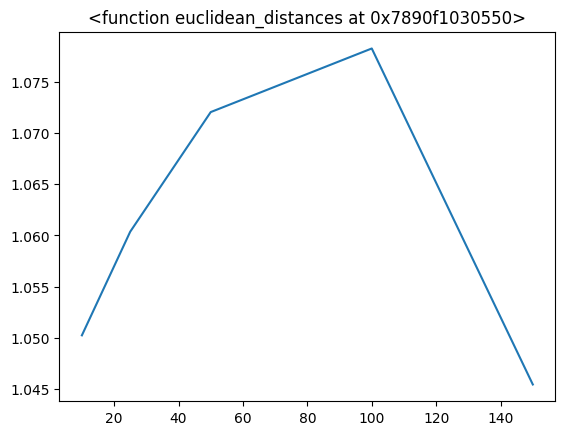

[1.0502446, 1.0603685, 1.072057, 1.078271, 1.0454437]


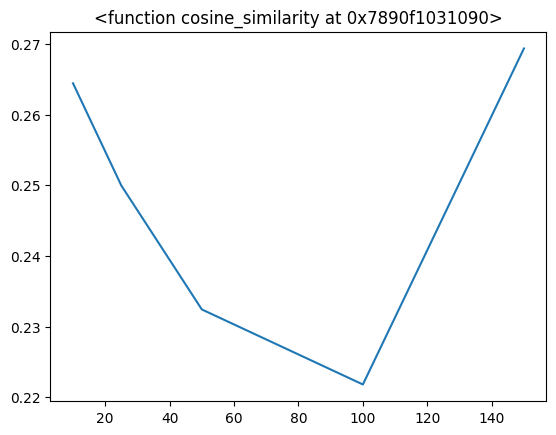

[0.26445186, 0.2499684, 0.23242109, 0.22179726, 0.2693838]


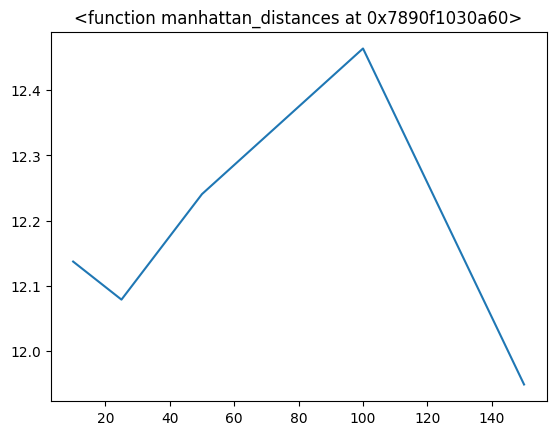

[12.137148850680205, 12.078746682680503, 12.240656893332329, 12.464157881899155, 11.948521668615285]


In [ ]:
epochs = []
scores = []
for method in [euclidean_distances, cosine_similarity, manhattan_distances]:
  for (method1, epoch) in avg_similarities:
    if method1 == method:
      epochs.append(epoch)
      scores.append(avg_similarities[(method1, epoch)])
  plt.plot(epochs, scores)
  plt.title(method)
  plt.show()
  print(scores)
  epochs, scores = [], []

In [ ]:
avg_similarities_ = {}
for model in evaluated_models:
  if model[0] == 'HolE':
    pipeline_results = evaluated_models[model]
    node_embeddings = pipeline_results.model.entity_representations[0]._embeddings.weight.data.cpu().numpy()

    visualize_embeddings(node_embeddings[:25], entity_labels[:25])

    nodes = node_embeddings[node_indices]
    for method in [euclidean_distances, cosine_similarity, manhattan_distances]:
        similarity_matrix = method(nodes)
        avg_similarities[(method, model[1])] = np.expand_dims(similarity_matrix, axis=1).mean()
        display_matrix(similarity_matrix, title=f'{model_name} - {model[1]} epochs')

In [ ]:
epochs = []
scores = []
for method in [euclidean_distances, cosine_similarity, manhattan_distances]:
  for (method1, epoch) in avg_similarities:
    if method1 == method:
      epochs.append(epoch)
      scores.append(avg_similarities[(method1, epoch)])
  plt.plot(epochs, scores)
  plt.title(method)
  plt.show()
  print(scores)
  epochs, scores = [], []

In [ ]:
evaluated_models

{('HolE',
  10): PipelineResult(random_seed=1283762439, model=HolE(
   (loss): MarginRankingLoss(
     (margin_activation): ReLU()
   )
   (interaction): HolEInteraction()
   (entity_representations): ModuleList(
     (0): Embedding(
       (_embeddings): Embedding(24624, 200)
     )
   )
   (relation_representations): ModuleList(
     (0): Embedding(
       (_embeddings): Embedding(351, 200)
     )
   )
   (weight_regularizers): ModuleList()
 ), training=TriplesFactory(num_entities=24624, num_relations=351, create_inverse_triples=False, num_triples=32203, path="/root/.data/pykeen/datasets/dbpedia50/train.txt"), training_loop=<pykeen.training.slcwa.SLCWATrainingLoop object at 0x7890d7aa18d0>, losses=[0.9980480968952179, 0.7585184550474561, 0.3034982143768242, 0.06533806521208986, 0.025424483740362266, 0.014854174848305918, 0.011171216714299388, 0.008940217659405862, 0.008164345002677735, 0.007397277879395655], metric_results=<pykeen.evaluation.rank_based_evaluator.RankBasedMetricResult